1. visualizzi i parchi di Milano e i comuni che vi fanno parte (vedi immagine allegata)


In [ ]:
!pip install geopandas
!pip install contextily
import geopandas 
import contextily as ctx

In [ ]:
bike_ciclabili = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/bike_ciclabili/bike_ciclabili.dbf')
quartieri = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/ds964_nil_wm (1)/NIL_WM.dbf')
fontanelle = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/Fontanelle/Fontanelle_OSM_ODbL.dbf")
parchi = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/Parchi_regionali_e_nazionali_polygon/Parchi_regionali_e_nazionali_polygon.dbf")
comuni = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/Limiti01012021_g/Com01012021_g")
province = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/Limiti01012021_g/ProvCM01012021_g")
regioni = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/Limiti01012021_g/Reg01012021_g")

In [ ]:
parchi.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
comuni.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
milano = comuni[comuni.COMUNE=='Milano']
milano

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1882,1,3,15,215,215,15146,015146,Milano,None,1,79382.994008,1.807534e+08,"POLYGON ((513714.538 5042508.056, 513985.199 5..."


In [ ]:
parchimilano = parchi[parchi.intersects(milano.geometry.squeeze())]
parchimilano

,FID,NOME,COD_AREA,CLASSIF,DCLASSIF,TIPO,DTIPO,TIPO_AREA,DTIPO_AREA,COD_NOME,geometry
20,21,Parco Nord Milano,22,5,Parco di cintura metropolitana,2,Parco Regionale,1,Area Regionale,22:Parco Nord Milano,"POLYGON ((516502.662 5041742.040, 516403.321 5..."
21,22,Parco Sud Milano,23,15,Parco agricolo e di cintura metropolitana,2,Parco Regionale,1,Area Regionale,23:Parco Sud Milano,"POLYGON ((533691.079 5042919.602, 533758.703 5..."


In [ ]:
comuniparchi = comuni[comuni.intersects(parchimilano.unary_union)]
comuniparchi

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1811,1,3,15,215,215,15002,015002,Abbiategrasso,None,0,43048.321516,4.777153e+07,"POLYGON ((493446.898 5029705.643, 493602.897 5..."
1812,1,3,15,215,215,15005,015005,Albairate,None,0,18919.829233,1.567417e+07,"POLYGON ((495595.883 5032525.624, 495661.881 5..."
1815,1,3,15,215,215,15010,015010,Arluno,None,0,18646.960825,1.278364e+07,"POLYGON ((496562.280 5041533.478, 496401.277 5..."
1816,1,3,15,215,215,15011,015011,Assago,None,0,12853.544196,8.397610e+06,"POLYGON ((511386.603 5029333.275, 511518.968 5..."
1817,1,3,15,215,215,15012,015012,Bareggio,None,0,15924.405593,1.130249e+07,"POLYGON ((499326.672 5038880.244, 499885.260 5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7465,1,3,98,0,98,98020,098020,Comazzo,None,0,22343.534930,1.277192e+07,"POLYGON ((534210.409 5035224.602, 534551.968 5..."
7484,1,3,98,0,98,98039,098039,Merlino,None,0,18053.583011,1.039029e+07,"POLYGON ((534698.954 5033625.792, 534731.476 5..."
7486,1,3,98,0,98,98041,098041,Mulazzano,None,0,22643.863100,1.529437e+07,"POLYGON ((530678.622 5027337.660, 530960.619 5..."
7500,1,3,98,0,98,98055,098055,Sordio,None,0,6681.722797,2.603890e+06,"POLYGON ((529834.629 5021137.707, 530206.624 5..."


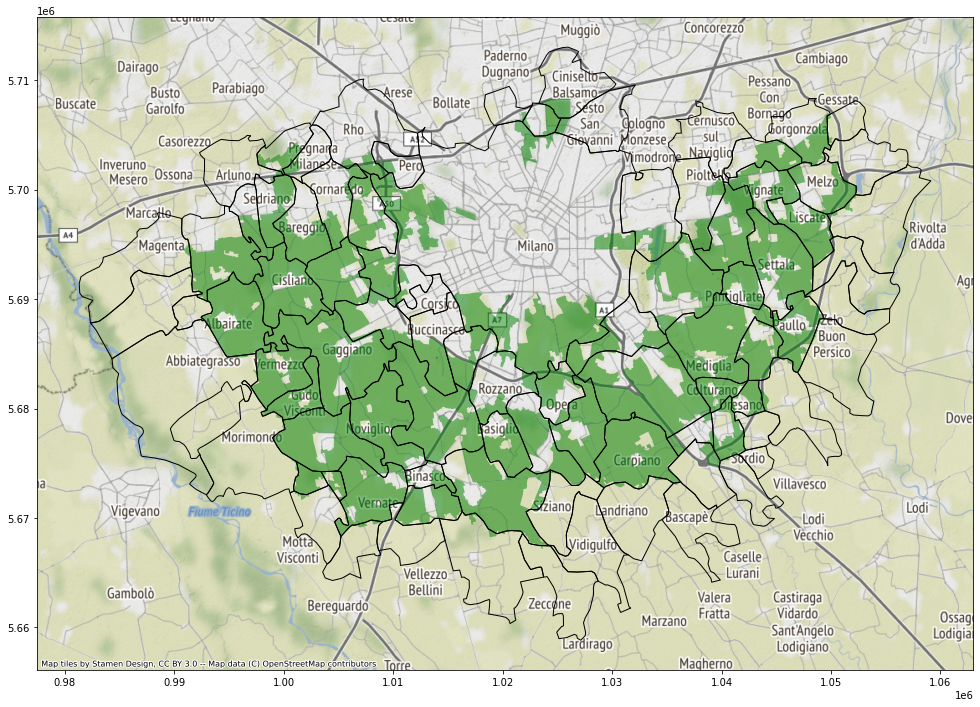

In [ ]:
ax = parchimilano.to_crs(epsg=3857).plot(figsize=(20,12),facecolor='green',alpha=0.5)
comuniparchi.to_crs(epsg=3857).plot(ax=ax,facecolor='none',edgecolor='k')
ctx.add_basemap(ax)

Visualizzare i comuni confinanti con Milano

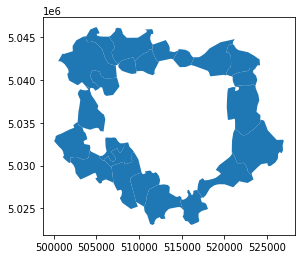

In [ ]:
comuniconfinanti = comuni[comuni.touches(milano.unary_union)]
comuniconfinanti.plot()

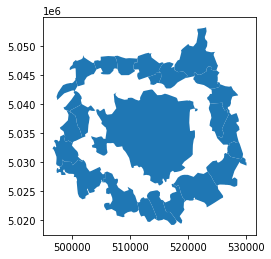

In [ ]:
comuniconfinanti2 = comuni[comuni.touches(comuniconfinanti.unary_union)]
comuniconfinanti2.plot()

il meno esteso comune confinante con Milano

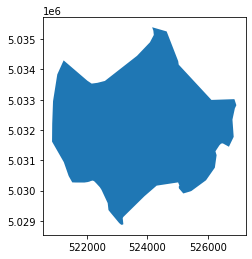

In [ ]:
comunepiuesteso = comuniconfinanti[comuniconfinanti.Shape_Area==comuniconfinanti.Shape_Area.max()]
comunepiuesteso.plot()

il meno esteso comune confinante con Milano

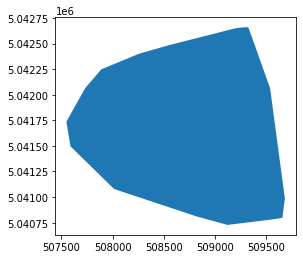

In [ ]:
comunemenoesteso = comuniconfinanti[comuniconfinanti.Shape_Area==comuniconfinanti.Shape_Area.min()]
comunemenoesteso.plot()

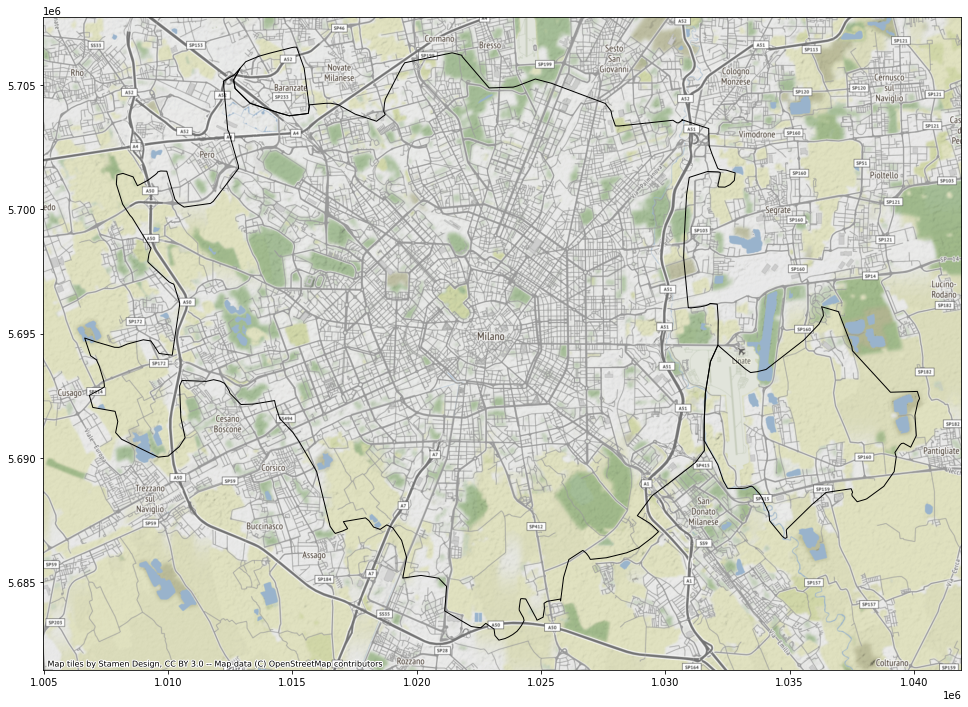

In [ ]:
ax = milano.to_crs(epsg=3857).plot(figsize=(20,12),facecolor='none',edgecolor='k')
comunepiuesteso.to_crs(epsg=3857).plot(ax=ax,facecolor='none',edgecolor='k')
comunemenoesteso.to_crs(epsg=3857).plot(ax=ax,facecolor='none',edgecolor='k')
ctx.add_basemap(ax)

2. analogo al primo esercizio ma tracciando sulla mappa solo i quartieri di Milano attraversati da parchi (e non tutta la città)

In [ ]:
quartieriparchi = quartieri[quartieri.intersects(parchimilano.to_crs(epsg=4326).geometry.unary_union)]
quartieriparchi

,ID_NIL,NIL,Valido_dal,Valido_al,Fonte,Shape_Leng,Shape_Area,OBJECTID,geometry
0,48,RONCHETTO SUL NAVIGLIO - Q.RE LODOVICO IL MORO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8723.368714,2.406306e+06,89,"POLYGON ((9.15422 45.43775, 9.15419 45.43707, ..."
1,64,TRENNO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3309.998800,4.896921e+05,90,"POLYGON ((9.10623 45.49016, 9.10295 45.48939, ..."
4,84,PARCO NORD,05/02/2020,Vigente,Milano 2030 - PGT Approvato,11741.717005,1.532331e+06,93,"POLYGON ((9.20040 45.52848, 9.20055 45.52828, ..."
5,63,FIGINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5622.522341,1.424660e+06,94,"POLYGON ((9.08375 45.48485, 9.08280 45.48521, ..."
9,61,QUARTO CAGNINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,4648.169991,9.863542e+05,98,"POLYGON ((9.11143 45.47640, 9.11193 45.47624, ..."
10,60,STADIO - IPPODROMI,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8277.734101,3.435178e+06,99,"POLYGON ((9.13020 45.48464, 9.13075 45.48449, ..."
11,62,QUINTO ROMANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6962.785127,1.645797e+06,100,"POLYGON ((9.08375 45.48485, 9.08444 45.48459, ..."
20,83,BRUZZANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6441.288643,1.670440e+06,109,"POLYGON ((9.17808 45.53479, 9.17807 45.53439, ..."
23,47,CANTALUPA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5161.415348,9.266817e+05,112,"POLYGON ((9.16112 45.42589, 9.16270 45.42544, ..."
24,39,QUINTOSOLE,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6740.830821,1.058525e+06,113,"POLYGON ((9.21047 45.39699, 9.21039 45.39698, ..."


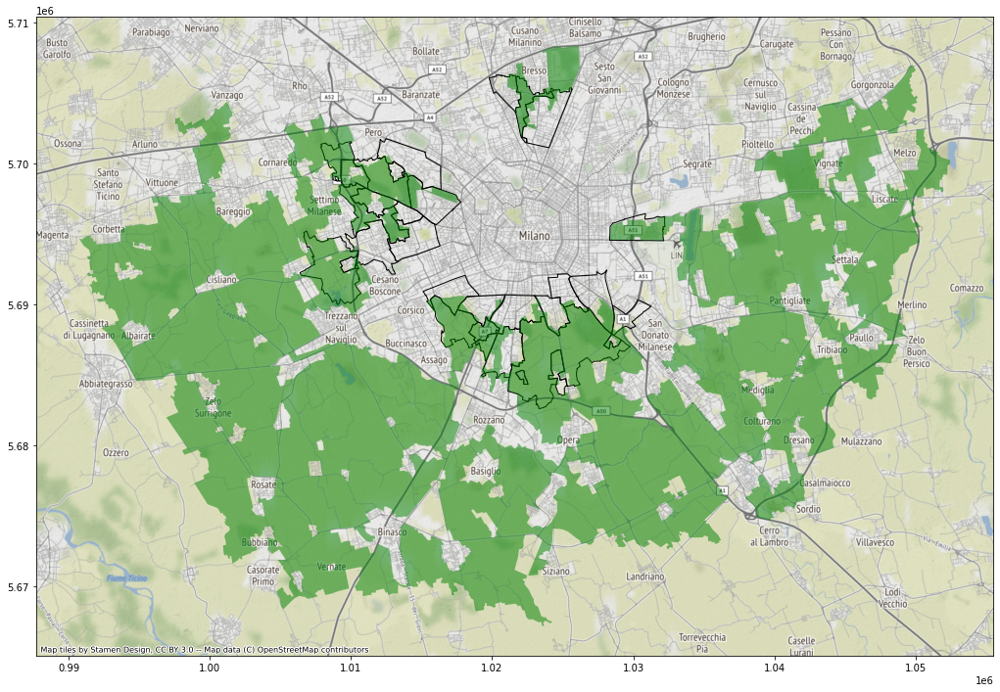

In [ ]:
ax = quartieriparchi.to_crs(epsg=3857).plot(figsize=(20,12),facecolor='none',edgecolor='k')
parchimilano.to_crs(epsg=3857).plot(ax=ax,facecolor='green',alpha=0.5)
ctx.add_basemap(ax)

3. dato il nome di un parco, avere la mappa del parco con i comuni che lo ospitano

Nome Parco: Parco Alto Garda Bresciano


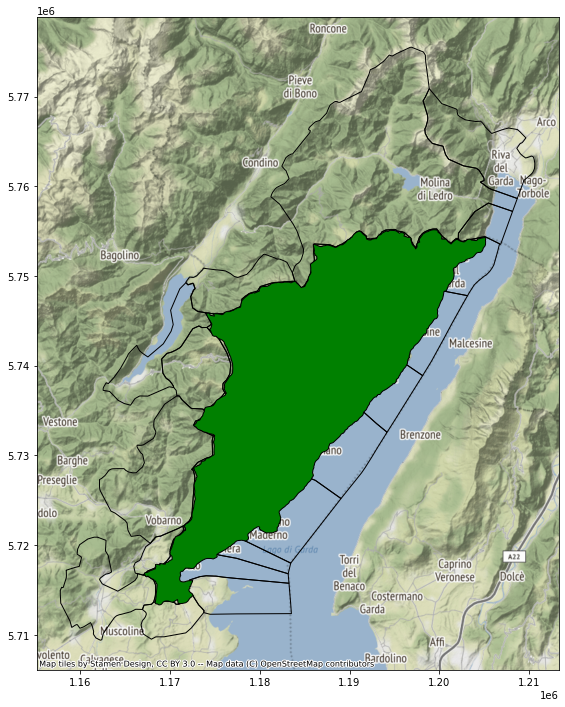

In [ ]:
user = input("Nome Parco: ")
lst = list(parchi['NOME'])
if user not in lst:
  print("Parco Non presente")
else:
  parco = parchi[parchi.NOME==user]
  parchicomuni = comuni[comuni.intersects(parco.unary_union)]
  ax = parchicomuni.to_crs(epsg=3857).plot(figsize=(20,12),facecolor='none',edgecolor='k')
  parco.to_crs(epsg=3857).plot(ax=ax,facecolor='green',edgecolor='k')
  ctx.add_basemap(ax)

4. dato il nome di un parco, avere la mappa del parco con le province che attraversa

Nome Parco: Parco Alto Garda Bresciano


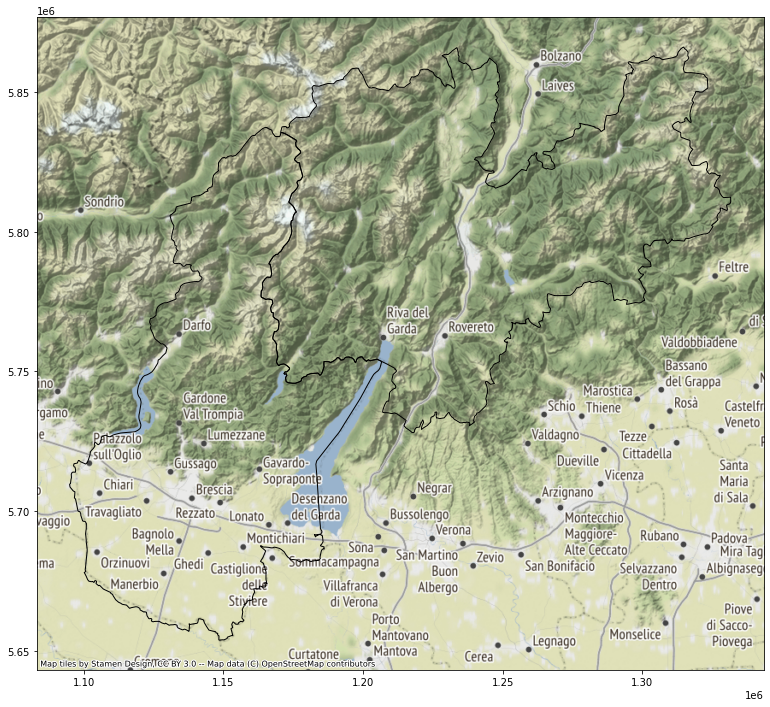

In [ ]:
user = input("Nome Parco: ")
lst = list(parchi['NOME'])
if user not in lst:
  print("Parco Non presente")
else:
  parco = parchi[parchi.NOME==user]
  parcoprov = province[province.intersects(parco.unary_union)]
  ax = parcoprov.to_crs(epsg=3857).plot(figsize=(20,12),facecolor='none',edgecolor='k')
  ctx.add_basemap(ax)

5. dato un comune, avere i parchi che ospita (elenco e mappa)

Nome Comune: Brescia


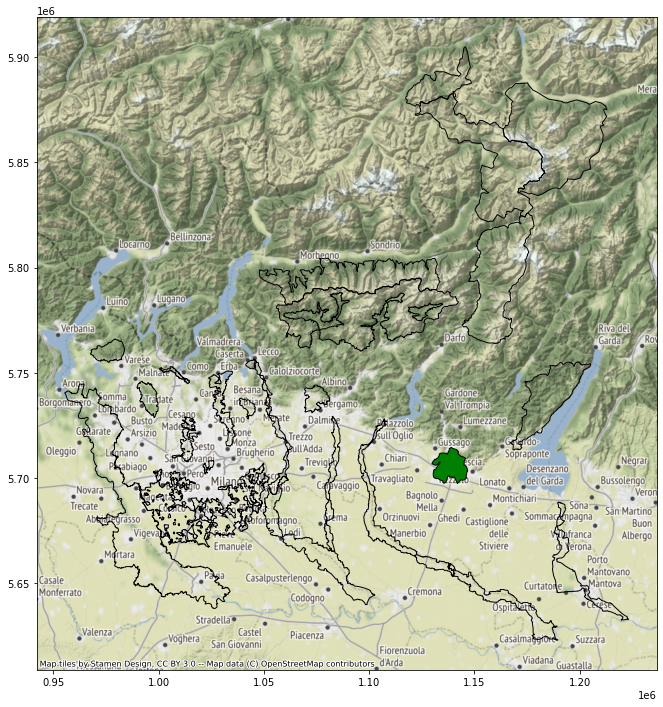

In [ ]:
user = input("Nome Comune: ")
lst = list(comuni['COMUNE'])
if user not in lst:
  print("Parco Non presente")
else:
  comparco = comuni[comuni.COMUNE==user]
  comuniparco = parchi[parchi.intersects(comuni.unary_union)]
  ax = comuniparco.to_crs(epsg=3857).plot(figsize=(20,12),facecolor='none',edgecolor='k')
  comparco.to_crs(epsg=3857).plot(ax=ax,facecolor='green',edgecolor='k')
  ctx.add_basemap(ax)

6. dato il nome di una provincia, avere i parchi che ospita (elenco e mappa)

Nome Province: Torino


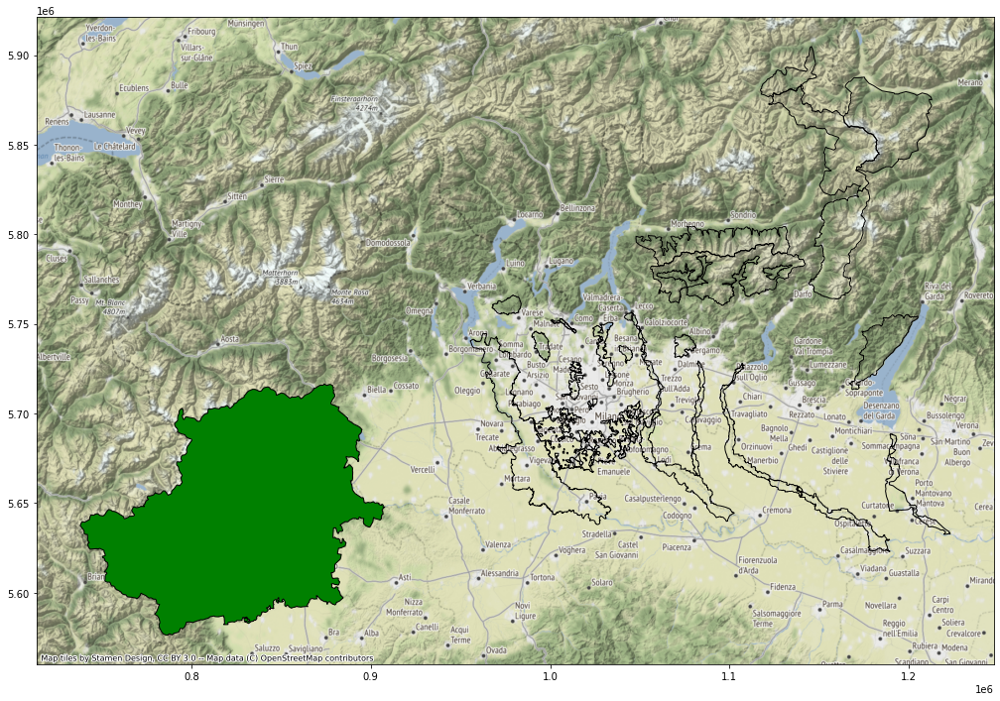

In [ ]:
user = input("Nome Province: ")
lst = list(province['DEN_UTS'])
if user not in lst:
  print("Parco Non presente")
else:
  provparco = province[province.DEN_UTS==user]
  provinceparco = parchi[parchi.intersects(province.unary_union)]
  ax = provinceparco.to_crs(epsg=3857).plot(figsize=(20,12),facecolor='none',edgecolor='k')
  provparco.to_crs(epsg=3857).plot(ax=ax,facecolor='green',edgecolor='k')
  ctx.add_basemap(ax)